 # Exploratory Data Analysis  - Hotel Booking Demand



![](https://i.imgur.com/RJtwr5d.jpeg)

This project objective is to investigate the Hotel Booking Demand. The dataset for this is available on [kaggle](https://www.kaggle.com/datasets/jessemostipak/hotel-booking-demand).
This data set contains booking information for a city hotel and a resort hotel, and includes information such as when the booking was made, length of stay, the number of adults, children, and/or babies, and the number of available parking spaces, among other things.
The data is originally from the article Hotel Booking Demand Datasets, written by Nuno Antonio, Ana Almeida, and Luis Nunes for Data in Brief, Volume 22, February 2019.


Exploratory Data Analysis (EDA) is the process of exploring, investigating and gathering insights from data using statistical measures and visualizations. The objective of EDA is to develop and understanding of data, by uncovering trends, relationships and patterns. 

**Outline**

Here is an outline of the steps , we will follow :

- Download the dataset from kaggle
- Importing useful liberaries
- Reading and Exploring Data
- Create some set of questions
- Graphical explorations for answering the questions
- Summarize the inference

In [1]:
!pip install jovian --upgrade --quiet

In [ ]:
import jovian

In [ ]:
jovian.commit()

<IPython.core.display.Javascript object>

[jovian] Attempting to save notebook..


## Download the dataset.

We'll use the `opendatasets` helper library to download files from the above URL.

In [2]:
!pip install opendatasets

In [1]:
import opendatasets as od

In [3]:
dataset_url = "https://www.kaggle.com/datasets/jessemostipak/hotel-booking-demand"
od.download(dataset_url)

Please provide your Kaggle credentials to download this dataset. Learn more: http://bit.ly/kaggle-creds
Your Kaggle username: shubhajagadeesha
Your Kaggle Key: ········


100%|█████████████████████████████████████████████████████████████████████████████| 1.25M/1.25M [00:00<00:00, 2.51MB/s]

## Importing useful liberaries
Here , we will import some useful liberaries according to our work like numpy , pandas , matplotlib ,seaborn etc.

In [55]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns
import plotly.express as px
import warnings
warnings.filterwarnings("ignore")
import matplotlib
%matplotlib inline

## Reading and exploring data
In this section , we will read data and explore the each column of input such as missing value analysis , data type analysis etc.

In [56]:
#Reading the data
Hotel_data_df = pd.read_csv('./hotel-booking-demand/hotel_bookings.csv')
Hotel_data_df.head()

,hotel,is_canceled,lead_time,arrival_date_year,arrival_date_month,arrival_date_week_number,arrival_date_day_of_month,stays_in_weekend_nights,stays_in_week_nights,adults,...,deposit_type,agent,company,days_in_waiting_list,customer_type,adr,required_car_parking_spaces,total_of_special_requests,reservation_status,reservation_status_date
0,Resort Hotel,0,342,2015,July,27,1,0,0,2,...,No Deposit,NaN,NaN,0,Transient,0.0,0,0,Check-Out,2015-07-01
1,Resort Hotel,0,737,2015,July,27,1,0,0,2,...,No Deposit,NaN,NaN,0,Transient,0.0,0,0,Check-Out,2015-07-01
2,Resort Hotel,0,7,2015,July,27,1,0,1,1,...,No Deposit,NaN,NaN,0,Transient,75.0,0,0,Check-Out,2015-07-02
3,Resort Hotel,0,13,2015,July,27,1,0,1,1,...,No Deposit,304.0,NaN,0,Transient,75.0,0,0,Check-Out,2015-07-02
4,Resort Hotel,0,14,2015,July,27,1,0,2,2,...,No Deposit,240.0,NaN,0,Transient,98.0,0,1,Check-Out,2015-07-03


In [57]:
Hotel_data_df.columns

Index(['hotel', 'is_canceled', 'lead_time', 'arrival_date_year',
       'arrival_date_month', 'arrival_date_week_number',
       'arrival_date_day_of_month', 'stays_in_weekend_nights',
       'stays_in_week_nights', 'adults', 'children', 'babies', 'meal',
       'country', 'market_segment', 'distribution_channel',
       'is_repeated_guest', 'previous_cancellations',
       'previous_bookings_not_canceled', 'reserved_room_type',
       'assigned_room_type', 'booking_changes', 'deposit_type', 'agent',
       'company', 'days_in_waiting_list', 'customer_type', 'adr',
       'required_car_parking_spaces', 'total_of_special_requests',
       'reservation_status', 'reservation_status_date'],
      dtype='object')

**Description of each columns of data.**

**hotel** : Hotel (H1 = Resort Hotel or H2 = City Hotel) 

**is_canceled:** Value indicating if the booking was canceled (1) or not (0) 

**lead_time:**  Number of days that elapsed between the entering date of the booking into the PMS and the arrival date

**arrival_date_year:** Year of arrival date

**arrival_date_month:**  Month of arrival date

**arrival_date_week_number:** Week number of year for arrival date

**arrival_date_day_of_month:** Day of arrival date

**stays_in_weekend_nights:** Number of weekend nights (Saturday or Sunday) the guest stayed or booked to stay at the hotel

**stays_in_week_nights:** Number of week nights (Monday to Friday) the guest stayed or booked to stay at the hotel

**adults:** Number of adults

**children:** Number of children

**babies:** Number of babies

**meal:** Type of meal booked. Categories are presented in standard hospitality meal packages: Undefined/SC – no meal package; BB – Bed & Breakfast; HB – Half board (breakfast and one other meal – usually dinner); FB – Full board (breakfast, lunch and dinner)

**country:** Country of origin. Categories are represented in the ISO 3155–3:2013 format

**market_segment:** Market segment designation. In categories, the term “TA” means “Travel Agents” and “TO” means “Tour Operators”

**distribution_channel:** Booking distribution channel. The term “TA” means “Travel Agents” and “TO” means “Tour Operators”

**is_repeated_guest:**  Value indicating if the booking name was from a repeated guest (1) or not (0)

**previous_cancellations:** Number of previous bookings that were cancelled by the customer prior to the current booking

**previous_bookings_not_canceled:** Number of previous bookings not cancelled by the customer prior to the current booking

**reserved_room_type:** Code of room type reserved. Code is presented instead of designation for anonymity reasons.

**assigned_room_type:** Code for the type of room assigned to the booking. Sometimes the assigned room type differs from the reserved room type due to hotel operation reasons (e.g. overbooking) or by customer request. Code is presented instead of designation for anonymity reasons.

**booking_changes:** Number of changes/amendments made to the booking from the moment the booking was entered on the PMS until the moment of check-in or cancellation

**deposit_type:** Indication on if the customer made a deposit to guarantee the booking. This variable can assume three categories: No Deposit – no deposit was made; Non Refund – a deposit was made in the value of the total stay cost; Refundable – a deposit was made with a value under the total cost of stay.

**agent:** ID of the travel agency that made the booking

**company:**  ID of the company/entity that made the booking or responsible for paying the booking. ID is presented instead of designation for anonymity reasons

**days_in_waiting_list:** Number of days the booking was in the waiting list before it was confirmed to the customer.

**customer_type:** Type of booking, assuming one of four categories: Contract - when the booking has an allotment or other type of contract associated to it; Group – when the booking is associated to a group; Transient – when the booking is not part of a group or contract, and is not associated to other transient booking; Transient-party – when the booking is transient, but is associated to at least other transient booking 

**adr:** Average Daily Rate as defined by dividing the sum of all lodging transactions by the total number of staying nights

**required_car_parking_spaces:** Number of car parking spaces required by the customer

**total_of_special_requests:**  Number of special requests made by the customer (e.g. twin bed or high floor)

**reservation_status:** Reservation last status, assuming one of three categories: Canceled – booking was canceled by the customer; Check-Out – customer has checked in but already departed; No-Show – customer did not check-in and did inform the hotel of the reason why

**reservation_status_date:**  Date at which the last status was set. This variable can be used in conjunction with the ReservationStatus to understand when was the booking canceled or when did the customer checked-out of the hotel  
    


In [58]:
# checking shape of the data
Hotel_data_df.shape

(119390, 32)

In [59]:
#information about the dataset
Hotel_data_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 119390 entries, 0 to 119389
Data columns (total 32 columns):
 #   Column                          Non-Null Count   Dtype  
---  ------                          --------------   -----  
 0   hotel                           119390 non-null  object 
 1   is_canceled                     119390 non-null  int64  
 2   lead_time                       119390 non-null  int64  
 3   arrival_date_year               119390 non-null  int64  
 4   arrival_date_month              119390 non-null  object 
 5   arrival_date_week_number        119390 non-null  int64  
 6   arrival_date_day_of_month       119390 non-null  int64  
 7   stays_in_weekend_nights         119390 non-null  int64  
 8   stays_in_week_nights            119390 non-null  int64  
 9   adults                          119390 non-null  int64  
 10  children                        119386 non-null  float64
 11  babies                          119390 non-null  int64  
 12  meal            

In [60]:
# describe data information in terms of mean , std
Hotel_data_df.describe()

,is_canceled,lead_time,arrival_date_year,arrival_date_week_number,arrival_date_day_of_month,stays_in_weekend_nights,stays_in_week_nights,adults,children,babies,is_repeated_guest,previous_cancellations,previous_bookings_not_canceled,booking_changes,agent,company,days_in_waiting_list,adr,required_car_parking_spaces,total_of_special_requests
count,119390.000000,119390.000000,119390.000000,119390.000000,119390.000000,119390.000000,119390.000000,119390.000000,119386.000000,119390.000000,119390.000000,119390.000000,119390.000000,119390.000000,103050.000000,6797.000000,119390.000000,119390.000000,119390.000000,119390.000000
mean,0.370416,104.011416,2016.156554,27.165173,15.798241,0.927599,2.500302,1.856403,0.103890,0.007949,0.031912,0.087118,0.137097,0.221124,86.693382,189.266735,2.321149,101.831122,0.062518,0.571363
std,0.482918,106.863097,0.707476,13.605138,8.780829,0.998613,1.908286,0.579261,0.398561,0.097436,0.175767,0.844336,1.497437,0.652306,110.774548,131.655015,17.594721,50.535790,0.245291,0.792798
min,0.000000,0.000000,2015.000000,1.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,6.000000,0.000000,-6.380000,0.000000,0.000000
25%,0.000000,18.000000,2016.000000,16.000000,8.000000,0.000000,1.000000,2.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,9.000000,62.000000,0.000000,69.290000,0.000000,0.000000
50%,0.000000,69.000000,2016.000000,28.000000,16.000000,1.000000,2.000000,2.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,14.000000,179.000000,0.000000,94.575000,0.000000,0.000000
75%,1.000000,160.000000,2017.000000,38.000000,23.000000,2.000000,3.000000,2.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,229.000000,270.000000,0.000000,126.000000,0.000000,1.000000
max,1.000000,737.000000,2017.000000,53.000000,31.000000,19.000000,50.000000,55.000000,10.000000,10.000000,1.000000,26.000000,72.000000,21.000000,535.000000,543.000000,391.000000,5400.000000,8.000000,5.000000


## Data Preprocessing & Cleaning with Pandas

- Removing 'company' column as it has 112593 null values.
- Dropping null values for 'country' column.
- Null value is replaced with mode value for 'agent' column.

In [61]:
#Null values
Hotel_data_df.isnull().sum()


hotel                                  0
is_canceled                            0
lead_time                              0
arrival_date_year                      0
arrival_date_month                     0
arrival_date_week_number               0
arrival_date_day_of_month              0
stays_in_weekend_nights                0
stays_in_week_nights                   0
adults                                 0
children                               4
babies                                 0
meal                                   0
country                              488
market_segment                         0
distribution_channel                   0
is_repeated_guest                      0
previous_cancellations                 0
previous_bookings_not_canceled         0
reserved_room_type                     0
assigned_room_type                     0
booking_changes                        0
deposit_type                           0
agent                              16340
company         

In [62]:
#Mode of agent column
Hotel_data_df.agent.mode()[0]

9.0

In [63]:
#dropping the company columns
Hotel_data_df.drop(['company'],axis=1,inplace=True)

In [64]:
#Null value is replaced with mode value for 'agent' column.
Hotel_data_df['agent'] = Hotel_data_df['agent'].fillna(Hotel_data_df['agent'].mode()[0])

#Dropping null values for 'country' column.
Hotel_data_df = Hotel_data_df.dropna(axis = 0, how ='any')
  

In [65]:
#Null values
Hotel_data_df.isnull().sum()

hotel                             0
is_canceled                       0
lead_time                         0
arrival_date_year                 0
arrival_date_month                0
arrival_date_week_number          0
arrival_date_day_of_month         0
stays_in_weekend_nights           0
stays_in_week_nights              0
adults                            0
children                          0
babies                            0
meal                              0
country                           0
market_segment                    0
distribution_channel              0
is_repeated_guest                 0
previous_cancellations            0
previous_bookings_not_canceled    0
reserved_room_type                0
assigned_room_type                0
booking_changes                   0
deposit_type                      0
agent                             0
days_in_waiting_list              0
customer_type                     0
adr                               0
required_car_parking_spaces 

In [66]:
#checking the duplicate values
Hotel_data_df.duplicated().sum()

31966

In [67]:
#dropping the duplicate values
Hotel_data_df.drop_duplicates(inplace=True)

In [68]:
#Droping rows with 0 guests
#Droping rows with 0 or less than 0 adr (average daily rate)
Hotel_data_df = Hotel_data_df[Hotel_data_df['adults'] != 0]
Hotel_data_df = Hotel_data_df[Hotel_data_df['adr'] > 0.00]

In [69]:
Hotel_data_df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 84925 entries, 2 to 119389
Data columns (total 31 columns):
 #   Column                          Non-Null Count  Dtype  
---  ------                          --------------  -----  
 0   hotel                           84925 non-null  object 
 1   is_canceled                     84925 non-null  int64  
 2   lead_time                       84925 non-null  int64  
 3   arrival_date_year               84925 non-null  int64  
 4   arrival_date_month              84925 non-null  object 
 5   arrival_date_week_number        84925 non-null  int64  
 6   arrival_date_day_of_month       84925 non-null  int64  
 7   stays_in_weekend_nights         84925 non-null  int64  
 8   stays_in_week_nights            84925 non-null  int64  
 9   adults                          84925 non-null  int64  
 10  children                        84925 non-null  float64
 11  babies                          84925 non-null  int64  
 12  meal                           

## Exploratory Data Analysis
In this section , we analyse the Hotel Booking data and visualize them into graphical representation.

In [70]:
#Correlation between variables
corr = Hotel_data_df.corr(method='pearson')

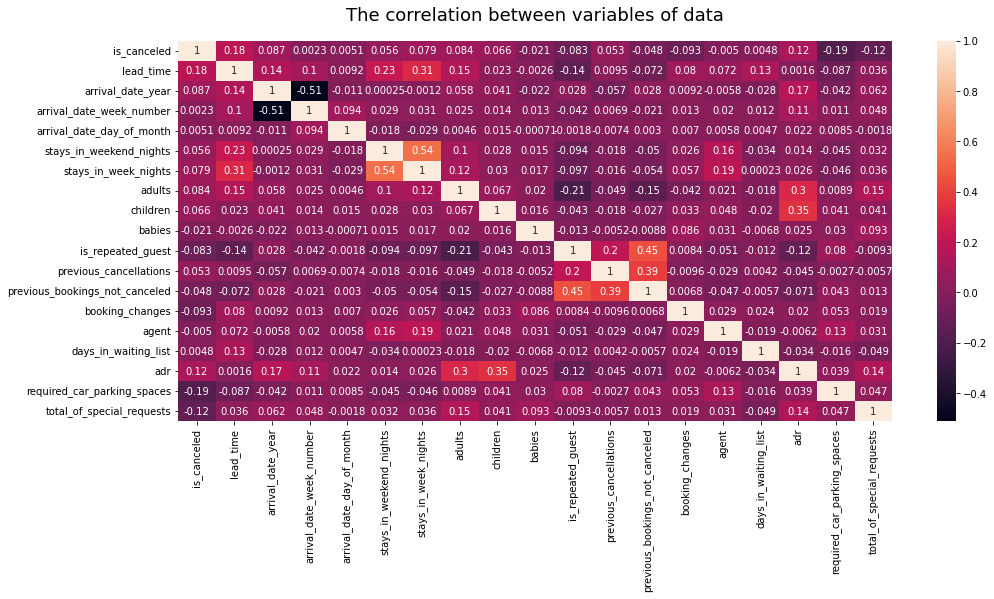

In [71]:
plt.figure(figsize=(16,7))
sns.heatmap(corr,annot=True);
plt.title("The correlation between variables of data",pad=20,fontsize=18);

###  Hotel Column

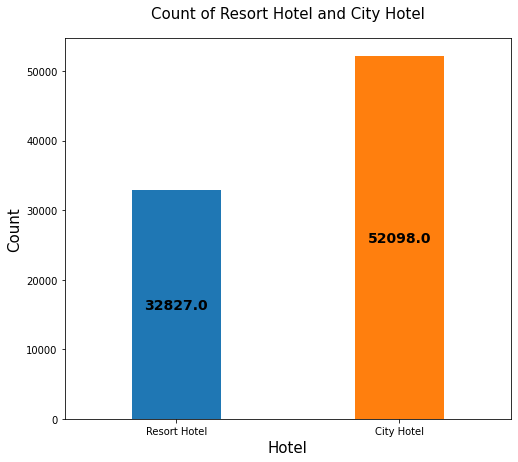

In [72]:
ax = sns.countplot(x = Hotel_data_df['hotel'],saturation=1.2);
fig = plt.gcf();
fig.set_size_inches(8,7);
plt.title('Count of Resort Hotel and City Hotel',fontsize= 15,pad=20);
plt.xlabel('Hotel',fontsize=15);
plt.ylabel('Count',fontsize=15);

for p in ax.patches:
        ax.annotate('{}'.format(p.get_height()), (p.get_x()+0.4, p.get_height()/2),
                    ha='center', va='center',weight='bold',size=14)
      
        current_width = p.get_width()
        diff = current_width - .4

        # we change the bar width
        p.set_width(.4)

        # we recenter the bar
        p.set_x(p.get_x() + diff * .5)

**Here, we can observe that City Hotels are more as compared to Resort Hotels**

###  is_canceled Column

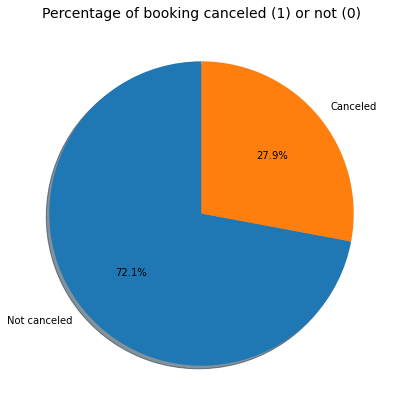

In [73]:
labels = ["Not canceled","Canceled"]
values = Hotel_data_df['is_canceled'].value_counts().values
fig = plt.figure(figsize=(10,7))
plt.pie(values,labels=labels,autopct='%1.1f%%',shadow=True,startangle=90)
plt.title('Percentage of booking canceled (1) or not (0)',size=14);

**From the above pie chart, we can see that 72.4% of bookings are not canceled and 27.6% are canceled.**

### Lead Time Column

In [74]:
fig = px.histogram (Hotel_data_df, x = "lead_time", nbins = 500, marginal = "box")
fig.update_layout(
    title="Lead time for bookings",
    
    font=dict(
        family="Arial",
        size=14,
        color="#cc3e0e"
    )
)

**Most of the reservations are made in the system 0 -1 day before the arrival.**

### arrival_date_year column              

We can identify the year with the highest number of arrivals using the value_counts method.

In [75]:
#Unique Values
Hotel_data_df['arrival_date_year'].unique()

array([2015, 2016, 2017], dtype=int64)

In [76]:
top_year = Hotel_data_df['arrival_date_year'].value_counts()
top_year

2016    41125
2017    31123
2015    12677
Name: arrival_date_year, dtype: int64

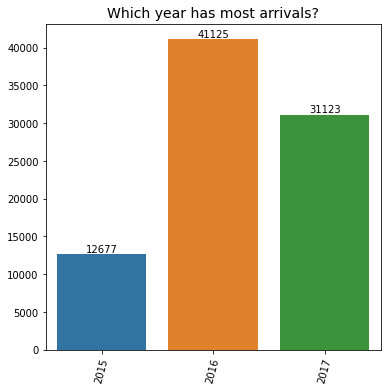

In [77]:
plt.figure(figsize=(6,6))
plt.xticks(rotation=75)
plt.title("Which year has most arrivals?", size = 14)
ax = sns.barplot(x = top_year.index, y = top_year.values);
for container in ax.containers:
    ax.bar_label(container)


**2016 has most arrivals and 2015 has less arrivals.**

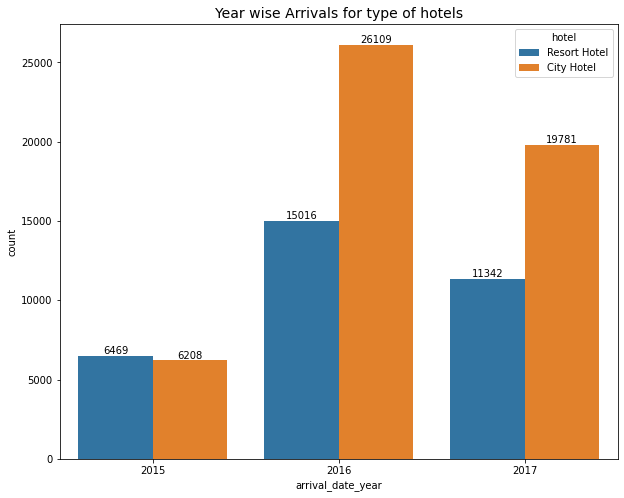

In [78]:
plt.figure(figsize=(10,8))
plt.title("Year wise Arrivals for type of hotels", size = 14)
ax = sns.countplot(x ='arrival_date_year', hue = "hotel", data = Hotel_data_df)

for container in ax.containers:
    ax.bar_label(container)
    


**Both City Hotel and Resort Hotel have most arrivals in 2016. Both City Hotel and Resort Hotel have less and almost equal arrivals in 2015.**


### arrival_date_month column            

In [79]:
df_year = Hotel_data_df.groupby(['arrival_date_month']).agg({'hotel':'count'}).reset_index()
df_year
    
fig = px.line(df_year, x="arrival_date_month", y="hotel")

# Set axis & legend labels
fig.update_layout(
    title="Monthly arrivals",
    xaxis_title="Months",
    yaxis_title="Number of bookings",
     plot_bgcolor='#ffcc9c',
    font=dict(
        family="Arial",
        size=14,
        color="#cc3e0e"
    )
)

# Start the Y axis from 0
fig.update_yaxes(rangemode='tozero')
# Start the Y axis from 0
fig.update_yaxes(rangemode='tozero')    

**From above graph, we observe that months August and July have more arrivals and January has less arrivals**

###  country column                  

### Top countries which has confirmed booking?

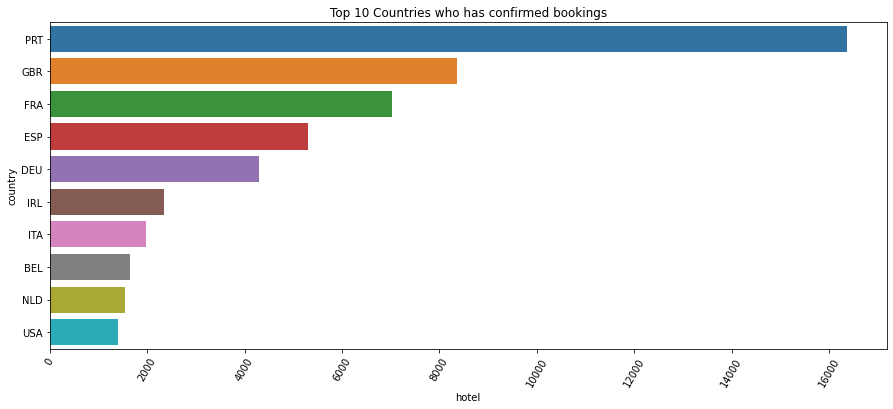

In [80]:
confirmed_bookings = Hotel_data_df[Hotel_data_df['is_canceled'] == 0]
df_country = confirmed_bookings.groupby(['country']).agg({'hotel':'count'}).reset_index().sort_values(by=['hotel'],ascending=False)[:10]
plt.figure(figsize=(15,6))
sns.barplot(y = "country",x = 'hotel', data = df_country)
plt.xticks(rotation = 60)
plt.title('Top 10 Countries who has confirmed bookings')
plt.show()

**Portugal (PRT) is at the top rank of the visiting country.**

### meal column

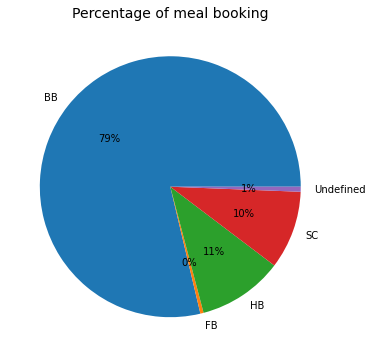

In [81]:
plt.figure(figsize=(15,6))
meal_booking = confirmed_bookings.groupby(['meal']).agg({'hotel':'count'}).reset_index()
plt.pie(meal_booking['hotel'], labels = meal_booking.meal, autopct='%.0f%%')
plt.title('Percentage of meal booking', size = 14)
plt.show()

**Most of the visitors prefer bed & breakfast (BB) followed by full board (FB), half board (HB) and self cater (SC)**

### is_repeated_guest column

### Hotel With Most Frequent Repeated Guest:

In [82]:
repeated_guest=Hotel_data_df[Hotel_data_df["is_repeated_guest"]==1]
repeated_guest=repeated_guest[["is_repeated_guest","hotel"]].value_counts().to_frame().reset_index()
repeated_guest

,is_repeated_guest,hotel,0
0,1,Resort Hotel,1573
1,1,City Hotel,1344


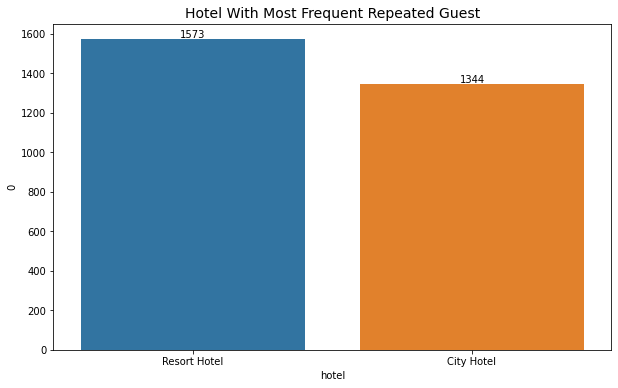

In [83]:
plt.figure(figsize=(10,6))
ax = sns.barplot(x="hotel",y=0,data=repeated_guest)
plt.title("Hotel With Most Frequent Repeated Guest", size =14)

for container in ax.containers:
    ax.bar_label(container)

plt.show()


**City Hotels has most no. Of Repeated Customers as compared To Resort Hotels.**

### Market Segment

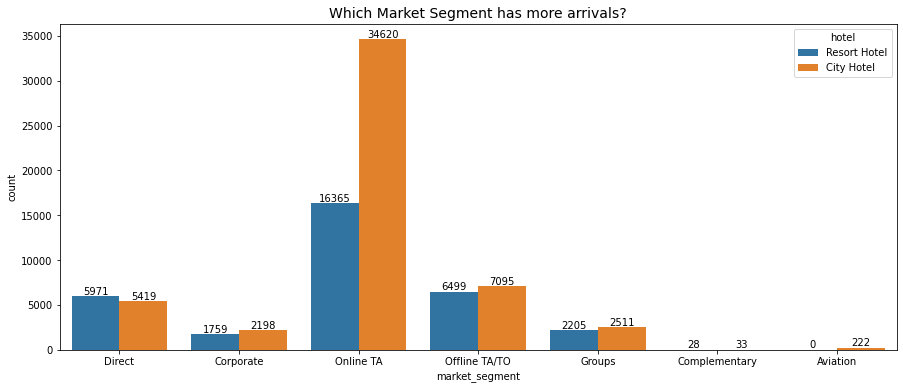

In [84]:
plt.figure(figsize=(15,6))
ax = sns.countplot(x=Hotel_data_df["market_segment"],data=Hotel_data_df,hue="hotel")

ax.set_title("Which Market Segment has more arrivals?", size = 14)
for container in ax.containers:
    ax.bar_label(container)
plt.show()




**Online Travel Agent & Offline Travel Agent Create most arrivals To both the Hotels.**

### Distribution Channel Column

In [151]:
fig = px.histogram(Hotel_data_df, x = "distribution_channel", color = 'is_canceled')
fig.update_layout(
    title=' Count of Distribution Channels'
)



**Most of the bookings come from Travel Agents or Tour Operators**

### assigned_room_type column

In [89]:
assigned_room=Hotel_data_df[["assigned_room_type","hotel"]].value_counts().to_frame().reset_index()
assigned_room

,assigned_room_type,hotel,0
0,A,City Hotel,32836
1,D,City Hotel,13031
2,A,Resort Hotel,12555
3,D,Resort Hotel,8948
4,E,Resort Hotel,5016
5,E,City Hotel,2002
6,C,Resort Hotel,1950
7,F,City Hotel,1911
8,G,Resort Hotel,1760
9,F,Resort Hotel,1596


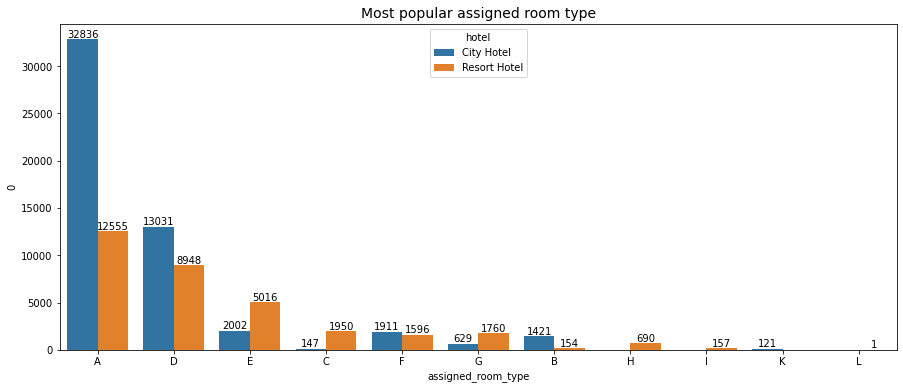

In [90]:
plt.figure(figsize=(15,6))
ax = sns.barplot(x="assigned_room_type",y=0,data=assigned_room,hue="hotel")

ax.set_title("Most popular assigned room type", size = 14)

for container in ax.containers:
    ax.bar_label(container)
plt.show()

**Room-A Most Popular Assigned Room in both The Hotels.**

### reserved_room_type column

In [92]:
Reserved_room=Hotel_data_df[["reserved_room_type","hotel"]].value_counts().to_frame().reset_index()
Reserved_room

,reserved_room_type,hotel,0
0,A,City Hotel,37114
1,A,Resort Hotel,17783
2,D,City Hotel,10648
3,D,Resort Hotel,6526
4,E,Resort Hotel,4480
5,F,City Hotel,1723
6,G,Resort Hotel,1534
7,E,City Hotel,1421
8,F,Resort Hotel,1020
9,C,Resort Hotel,885


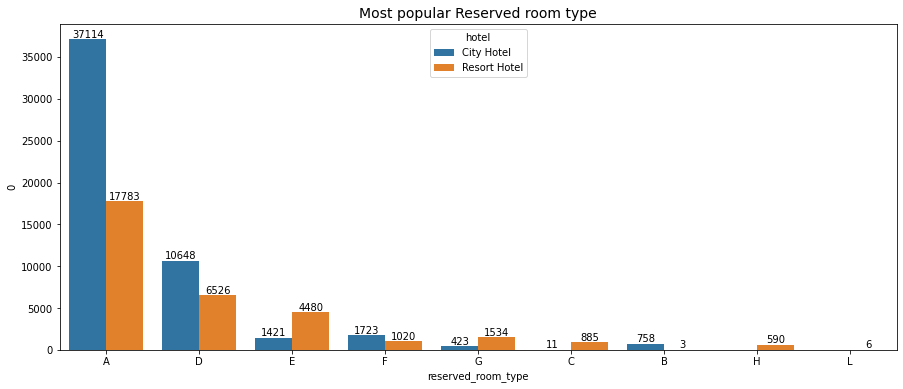

In [93]:
plt.figure(figsize=(15,6))
ax  = sns.barplot(x="reserved_room_type",y=0,data=Reserved_room,hue="hotel")

ax.set_title("Most popular Reserved room type", size = 14)

for container in ax.containers:
    ax.bar_label(container)
plt.show()
plt.show()

**Room-A is Most Popular Reserved Room in both the Hotels.**

### customer_type column                  

In [96]:
Reserved_room=Hotel_data_df[["customer_type"]].value_counts().to_frame().reset_index()

In [97]:
fig =px.pie(confirmed_booking_df, 
       values = confirmed_booking_df['customer_type'].value_counts(), 
       names = confirmed_booking_df['customer_type'].unique(), 
       )
fig.update_layout(
    title = 'Customer type of Bookings',
    legend_title="Customer Type",
    font=dict(
        size=14
    )
)
fig.layout.template = 'plotly'
fig.show()

### Asking and Answering Questions
We've already gained several insights about the Hotel data by exploring individual columns of the dataset. Let's ask some specific questions and try to answer them using data frame operations and visualizations.

### 1. How Cancelation and hotels are related?

In [99]:
fig = px.histogram (Hotel_data_df, x = "hotel", color = 'is_canceled')
fig.update_layout(
    title="Count of canceled and confirmed bookings for type of hotels",
    
    font=dict(
        family="Arial",
        size=14,
        color="#cc3e0e"
    )
)

**The higher the percentage of reservations is , the higher the percentage of cancellation .**

### 2.Which Country Has Most No. of Hotels ?

In [100]:
country_hotel=Hotel_data_df[["country","hotel"]].value_counts().to_frame()
country_hotel=country_hotel.reset_index()
country_hotel

,country,hotel,0
0,PRT,Resort Hotel,13715
1,PRT,City Hotel,12265
2,FRA,City Hotel,7348
3,GBR,Resort Hotel,5852
4,GBR,City Hotel,4492
...,...,...,...
285,GGY,City Hotel,1
286,FJI,Resort Hotel,1
287,NPL,Resort Hotel,1
288,SYC,Resort Hotel,1


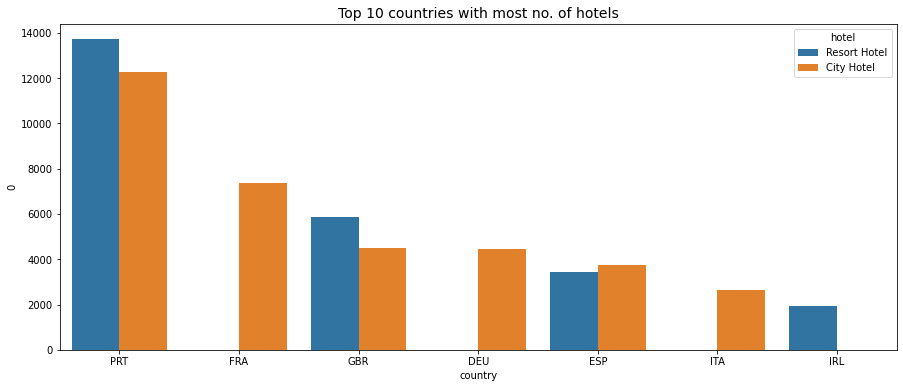

In [101]:
plt.figure(figsize=(15,6))
sns.barplot(x=country_hotel["country"][0:10],y=country_hotel[0],data=country_hotel,hue="hotel")
plt.title("Top 10 countries with most no. of hotels", size = 14)
plt.show()

In [102]:
px.choropleth(
    country_hotel, 
    locations = 'country',
    color = 0,     
    labels={'0':'Number of Hotels'}, 
    title = 'Number of hotels'
    )

**Portugal Has Most No. Resort Hotels and City Hotels As Compared To Others Countries.**

In [ ]:
### 3. what is the Price Per Guest as per hotel type over the years?

In [113]:
confirmed_booking_df = Hotel_data_df[Hotel_data_df['is_canceled'] == 0]
confirmed_booking_df.shape

(61197, 31)

In [114]:
confirmed_booking_df['price_per_guest'] = confirmed_booking_df['adr']/(confirmed_booking_df['adults'] + confirmed_booking_df['children'])

In [118]:
fig = px.box(confirmed_booking_df, x = "arrival_date_year", y = "price_per_guest", color = "hotel")
fig.update_layout(
    title='Price Per Guest for type of hotels '
)


**City Hotel is costlier than Resort Hotel and it looks like the price per guest of City Hotel is increasing over the years.**

### 4. How Price is distributed according to Room Type?

In [119]:
fig = px.box(confirmed_booking_df,
          x = 'reserved_room_type', 
          y = 'price_per_guest', 
          color = 'hotel',width=870, height=500)
fig.update_layout(
    title='Price Distribution According to Room Type',
    xaxis_title="Reserved Room Type",
    yaxis_title="Price per Guest",
    legend_title="Hotel Type",
    font=dict(
        size=17
    )
)
fig.layout.template = 'plotly'
fig.show() 

**price per guest depends on the reserved room type. The price per room type is also more expensive for City Hotel than Resort Hotel.**

### 5.How many guests are there who have repeatedly canceled the bookings?

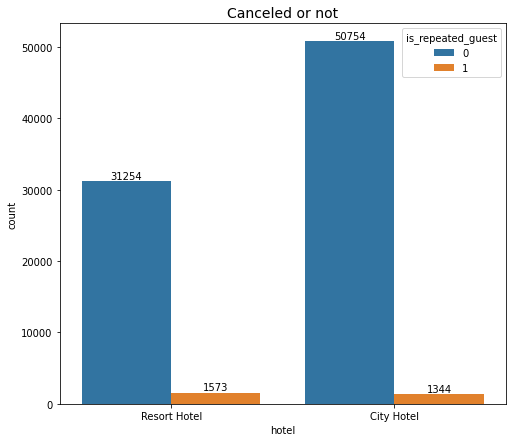

In [133]:
plt.figure(figsize=(8,7))
plt.title("Canceled or not", fontdict = {'fontsize': 14})
ax = sns.countplot(x = 'hotel', hue = 'is_repeated_guest', data = Hotel_data_df)
for container in ax.containers:
    ax.bar_label(container)


**New guest cancelled their booking more often than repeated guest.**

### 6. Average daily rate per year(adr)

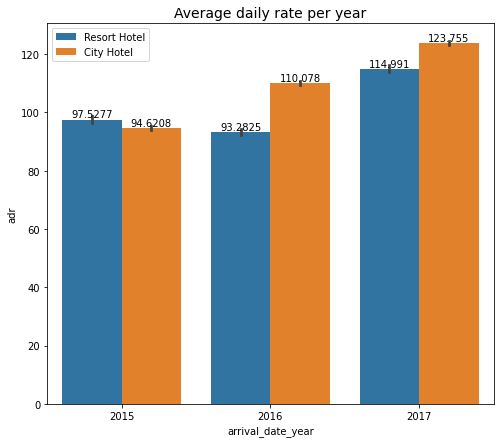

In [135]:
plt.figure(figsize=(8,7))
ax = sns.barplot(x="arrival_date_year", y="adr", data=Hotel_data_df, hue="hotel")
ax.set_title("Average daily rate per year", size = 14)
plt.legend(loc="upper left")
for container in ax.containers:
    ax.bar_label(container)


**average daily rate of 2015 in resort hotel and City hotel is 97 and 94
average daily rate of 2016 in resort hotel and City hotel is 93 and 110
average daily rate of 2017 in resort hotel and City hotel is 114 and 123
only in 2015 resort hotel adr is greater then city hotel as compare to other.**

### 7. Which hotel make more revenue?

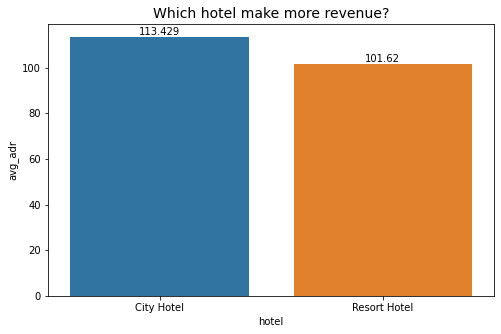

In [144]:
avg_adr = Hotel_data_df.groupby('hotel')['adr'].agg(np.mean).reset_index().rename(columns = {'adr':'avg_adr'})  

plt.figure(figsize = (8,5)) 
ax = sns.barplot(x = 'hotel', y = 'avg_adr', data=avg_adr)
ax.set_title("Which hotel make more revenue?", size = 14)
for container in ax.containers:
    ax.bar_label(container)


**City hotel has more revenue than Resort hotel**

### 8. How average daily rate is changing with arrival months?

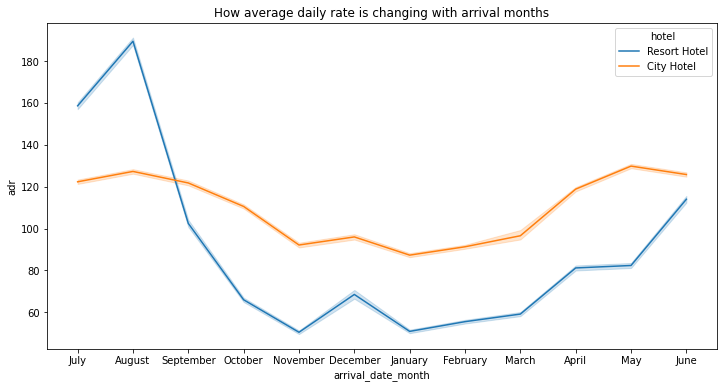

In [152]:
plt.figure(figsize=(12,6))

ax = sns.lineplot(x="arrival_date_month", y="adr", hue="hotel", data=Hotel_data_df)
ax.set_title("How average daily rate is changing with arrival months");

**For Resort Hotel, ADR is more expensive during July, August & September and for City Hotel, ADR is slightly more during August, April & May.**

### 9.How long do the guests stay at the hotel?

Text(0, 0.5, 'Number of bookings')

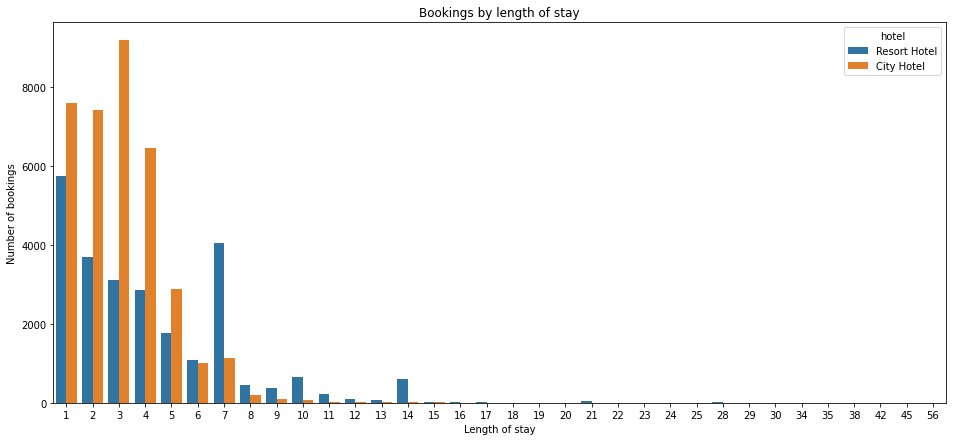

In [158]:
confirmed_bookings['total_stay'] = confirmed_bookings['stays_in_week_nights'] + confirmed_bookings['stays_in_weekend_nights']

plt.figure(figsize = (16, 7))

sns.countplot(x = 'total_stay', data = confirmed_bookings, hue = 'hotel')
plt.title('Bookings by length of stay')
plt.xlabel('Length of stay')
plt.ylabel('Number of bookings')





**Guests prefer to spend between 1 and 4 days at the hotel, in the case of the resort there are more stays of longer duration.**

# Summary
We've drawn many inferences from the analysis. Here's a summary of them:

- City Hotels are more as compared to Resort Hotels.
- 72.4% of bookings are not canceled and 27.6% are canceled.
- The higher the percentage of reservations is , the higher the percentage of cancellation.
- Most of the reservations are made in the system 0 -1 day before the arrival
- 2016 has most arrivals and 2015 has less arrivals.
- Both City Hotel and Resort Hotel have most arrivals in 2016. Both City Hotel and Resort Hotel have less and almost equal arrivals in 2015.
- From above graph, we observe that months August and July have more arrivals and January has less arrivals.
- Portugal (PRT) is at the top rank of the visiting country.
- Portugal Has Most No. Resort Hotels and City Hotels As Compared To Others Countries.
- Most of the visitors prefer bed & breakfast (BB) followed by full board (FB), half board (HB) and self cater (SC).
- City Hotels has most no. Of Repeated Customers as compared To Resort Hotels.
- Online Travel Agent & Offline Travel Agent Create most arrivals To both the Hotels.
- Most of the bookings come from Travel Agents or Tour Operators.
- Room-A Most Popular Assigned Room in both The Hotels.
- Room-A is Most Popular Reserved Room in both the Hotels.
- City Hotel is costlier than Resort Hotel and it looks like the price per guest of City Hotel is increasing over the years.
- price per guest depends on the reserved room type. The price per room type is also more expensive for City Hotel than Resort.
Hotel.
- New guest cancelled their booking more often than repeated guest.
- Only in 2015 resort hotel adr is greater then city hotel as compare to other

# Future Work
- Analysis with remaining variables
- Regression analysis with machine learning models

# References
- https://pandas.pydata.org/docs/user_guide/index.html

- https://matplotlib.org/3.3.1/users/index.html

- https://jovian.ai/learn/zero-to-data-analyst-bootcamp/lesson/exploratory-data-analysis-case-study